In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.datasets import make_blobs
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import roc_curve, auc, accuracy_score, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from scipy.spatial import distance
from sklearn.utils import resample
from typing import List, Dict, Optional
from itertools import combinations

sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (10, 6)

PALETTE_NORDIC = ['#5E81AC', '#BF616A', '#A3BE8C'] 
sns.set_palette(PALETTE_NORDIC)
PALETTE = {
    'class_0': '#5E81AC',
    'class_1': '#BF616A',
    'class_2': '#A3BE8C',
    'pred_0': '#81A1C1',
    'pred_1': '#D08770',
    'linear_line': '#A3BE8C',
    'linear_ci': 'rgba(163, 190, 140, 0.2)',
    'logistic_line': '#EBCB8B',
    'logistic_ci': 'rgba(235, 203, 139, 0.2)',
    'roc_ci': 'rgba(128, 128, 128, 0.15)',
    'threshold': '#D08770',
    'log_boundary': '#EBCB8B',
    'lin_boundary': '#A3BE8C',
    'text': '#2E3440'
}

In [ ]:
class DataHandler:
    def __init__(self, n_samples=300, n_features=8, random_state=42, target_col='target'):
        self.n_samples = n_samples
        self.n_features = n_features
        self.random_state = random_state
        self.rng = np.random.default_rng(random_state)
        self.target_col = target_col
        self.datasets = {}

    def generate_base_dataset(self):
        c0 = [1.0] * self.n_features
        c1 = [-1.0] * self.n_features
        c2 = [1.0 if i % 2 == 0 else -1.0 for i in range(self.n_features)]
        centers = [c0, c1, c2]
        
        X, y = make_blobs(
            n_samples=self.n_samples, 
            centers=centers, 
            n_features=self.n_features, 
            cluster_std=0.8, 
            random_state=self.random_state
        )
        
        cols = [f'feature_{i+1}' for i in range(self.n_features)]
        df = pd.DataFrame(X, columns=cols)
        df[self.target_col] = y
        self.datasets['base'] = df
        print(f"[Generate] Базовый датасет создан: {df.shape}")
        return df

    def generate_injected_datasets(self, A_values, B_values, jitter=0.2):
        base_df = self.datasets.get('base')
        if base_df is None:
            raise ValueError("Base dataset not generated.")
        
        base_X = base_df.drop(self.target_col, axis=1)
        base_y = base_df[self.target_col]
        feat_cols = base_X.columns
        
        for A in A_values:
            for B in B_values:
                center_coords = np.array([float(B)] * self.n_features)
                noise = self.rng.normal(loc=0.0, scale=jitter, size=(A, self.n_features))
                outliers_data = center_coords + noise
                
                outliers_X = pd.DataFrame(outliers_data, columns=feat_cols)
                outliers_y = pd.Series([0] * A, name=self.target_col)
                
                new_X = pd.concat([base_X, outliers_X], ignore_index=True)
                new_y = pd.concat([base_y, outliers_y], ignore_index=True)
                df_new = pd.concat([new_X, new_y], axis=1)
                
                key = f"df_{A}_{B}"
                self.datasets[key] = df_new
        
        print(f"[Generate] Создано {len(A_values) * len(B_values)} модифицированных датасетов.")
        return {k: v for k, v in self.datasets.items() if k != 'base'}

    def show_summary(self, dataset_key='base'):
        df = self.datasets.get(dataset_key)
        if df is None: return
        
        feature_cols = [c for c in df.columns if c != self.target_col]
        
        metrics_data = [
            ['Всего строк', 'Признаков', 'Классов', 'Пропусков'],
            [
                df.shape[0],
                len(feature_cols),
                df[self.target_col].nunique(),
                df.isna().sum().sum()
            ]
        ]

        desc_df = df.describe().T.reset_index().round(2)
        desc_header = desc_df.columns.tolist()
        desc_values = [desc_df[col].tolist() for col in desc_header]

        fig = make_subplots(
            rows=2, cols=1,
            vertical_spacing=0.08,
            specs=[[{"type": "table"}], [{"type": "table"}]],
            subplot_titles=("Ключевые метрики датасета", "Описательная статистика")
        )

        fig.add_trace(go.Table(
            header=dict(
                values=["<b>Метрика</b>", "<b>Значение</b>"],
                fill_color=PALETTE_NORDIC[0],
                align='left',
                font=dict(color='white', size=12)
            ),
            cells=dict(
                values=metrics_data,
                fill_color='whitesmoke',
                align='left',
                font=dict(color='black', size=11),
                height=30
            )
        ), row=1, col=1)

        fig.add_trace(go.Table(
            header=dict(
                values=[f"<b>{c}</b>" for c in desc_header],
                fill_color=PALETTE_NORDIC[0],
                align='center',
                font=dict(color='white', size=11)
            ),
            cells=dict(
                values=desc_values,
                fill_color=['whitesmoke']*len(desc_header),
                align='center',
                font=dict(color='black', size=10),
                height=25
            )
        ), row=2, col=1)

        fig.update_layout(height=700, title_text=f"Отчет по датасету {dataset_key}", template='plotly_white')
        fig.show()

    def plot_correlation_matrix(self, dataset_key='base'):
        df = self.datasets.get(dataset_key)
        if df is None: return
        
        feature_cols = [c for c in df.columns if c != self.target_col]
        plt.figure(figsize=(9, 7))
        corr = df[feature_cols].corr()
        mask = np.triu(np.ones_like(corr, dtype=bool))
        
        sns.heatmap(
            corr, mask=mask, annot=True, fmt=".2f", 
            cmap='RdBu_r', center=0, square=True,
            linewidths=.5, cbar_kws={"shrink": .8}
        )
        plt.title('Матрица корреляций признаков (Пирсон)')
        plt.show()

    def plot_pca_advanced(self, dataset_key='base'):
        df = self.datasets.get(dataset_key)
        if df is None: return
        
        feature_cols = [c for c in df.columns if c != self.target_col]
        
        pca = PCA(n_components=3)
        components = pca.fit_transform(df[feature_cols])
        var = pca.explained_variance_ratio_ * 100
        
        centroids_original = df.groupby(self.target_col)[feature_cols].mean()
        centroids_pca = pca.transform(centroids_original)
        
        overall_mean_orig = df[feature_cols].mean().to_frame().T
        overall_mean_pca = pca.transform(overall_mean_orig)[0] 
        
        plot_df = pd.DataFrame(components, columns=['x', 'y', 'z'])
        plot_df['Class'] = df[self.target_col].astype(str)
        
        fig = px.scatter_3d(
            plot_df, x='x', y='y', z='z', color='Class',
            title=f'3D PCA Analysis (Total Variance: {var.sum():.1f}%)',
            opacity=0.3, 
            color_discrete_sequence=PALETTE_NORDIC,
            template='plotly_white', 
            height=800
        )
        
        n_f = len(feature_cols)
        theor_centers = [
            [1.0]*n_f, [-1.0]*n_f, [1.0 if i%2==0 else -1.0 for i in range(n_f)]
        ]
        
        for i, (c_pca, c_orig) in enumerate(zip(centroids_pca, centroids_original.values)):
            diff = np.linalg.norm(c_orig - theor_centers[i])
            tooltip = f"<b>Class {i} Centroid</b><br>Diff from theory: {diff:.3f}"
            
            fig.add_trace(go.Scatter3d(
                x=[c_pca[0]], y=[c_pca[1]], z=[c_pca[2]],
                mode='markers+text',
                name=f'Center {i}',
                text=[f"C{i}"], textposition="top center",
                textfont=dict(size=10, color='gray'),
                marker=dict(size=12, symbol='diamond', color='#EBCB8B', line=dict(width=2, color='#4C566A')),
                hovertext=tooltip, hoverinfo="text"
            ))

        fig.add_trace(go.Scatter3d(
            x=[overall_mean_pca[0]], y=[overall_mean_pca[1]], z=[overall_mean_pca[2]],
            mode='markers',
            name='Overall Mean',
            marker=dict(
                size=10, 
                symbol='x', 
                color='#2E3440', 
                line=dict(width=4, color='white'),
                opacity=1.0
            ), 
            hovertext="<b>Overall Center of Mass</b>", hoverinfo="text"
        ))

        pairs = [(0, 1), (1, 2), (0, 2)]
        
        for p1, p2 in pairs:
            x_line = [centroids_pca[p1, 0], centroids_pca[p2, 0]]
            y_line = [centroids_pca[p1, 1], centroids_pca[p2, 1]]
            z_line = [centroids_pca[p1, 2], centroids_pca[p2, 2]]
            
            real_dist = distance.euclidean(centroids_original.iloc[p1], centroids_original.iloc[p2])
            
            fig.add_trace(go.Scatter3d(
                x=x_line, y=y_line, z=z_line,
                mode='lines',
                line=dict(color='#4C566A', width=3, dash='dot'), 
                showlegend=False, hoverinfo='skip'
            ))
            
            mid_x = np.mean(x_line)
            mid_y = np.mean(y_line)
            mid_z = np.mean(z_line)
            
            fig.add_trace(go.Scatter3d(
                x=[mid_x], y=[mid_y], z=[mid_z],
                mode='text',
                text=[f"{real_dist:.2f}"],
                textfont=dict(color='#2E3440', size=11, family="Arial Black"),
                showlegend=False
            ))

        fig.show()

    def plot_pairplot(self, dataset_key='base'):
        df = self.datasets.get(dataset_key)
        if df is None: return
        
        g = sns.pairplot(
            df, 
            hue=self.target_col, 
            palette=PALETTE_NORDIC, 
            corner=True,
            plot_kws={'alpha': 0.6, 's': 20}
        )
        g.fig.suptitle('Попарные распределения', y=1.02)
        plt.show()

class RegressionAnalyzer:
    def __init__(self, target_col: str = 'target', n_bootstraps: int = 200):
        self.target_col = target_col
        self.n_bootstraps = n_bootstraps
        self.projection_model = None

    def fit_projection(self, df: pd.DataFrame, feature_cols: List[str], classes: List[int] = [0, 1]):
        df_sub = df[df[self.target_col].isin(classes)].copy()
        y = df_sub[self.target_col].map({classes[0]: 0, classes[1]: 1}).values
        X = df_sub[feature_cols].values
        
        self.projection_model = LinearRegression()
        self.projection_model.fit(X, y)
        print(f"Projection Model Fitted. Coefs: {np.round(self.projection_model.coef_, 3)}")

    def project_datasets(self, datasets_dict: Dict[str, pd.DataFrame], feature_cols: List[str], classes: List[int] = [0, 1]):
        if self.projection_model is None:
            raise ValueError("Projection model not fitted.")
        
        projected = {}
        for name, df in datasets_dict.items():
            df_sub = df[df[self.target_col].isin(classes)].copy()
            X = df_sub[feature_cols].values
            y = df_sub[self.target_col].map({classes[0]: 0, classes[1]: 1}).values
            
            scores = self.projection_model.predict(X)
            
            new_name = f"proj_{name}"
            projected[new_name] = pd.DataFrame({
                'projected_score': scores,
                'target': y
            })
        return projected

    def analyze(self, datasets_dict: Dict[str, pd.DataFrame], feature_col: str = 'feature_1', classes: List[int] = [0, 1], is_projected: bool = False, dataset_names: Optional[List[str]] = None):
        keys = dataset_names if dataset_names else datasets_dict.keys()
        
        for name in keys:
            if name not in datasets_dict: continue
            
            df = datasets_dict[name]
            if not is_projected:
                df_binary = df[df[self.target_col].isin(classes)].copy()
                map_cls = {classes[0]: 0, classes[1]: 1}
                y = df_binary[self.target_col].map(map_cls).values
                X = df_binary[[feature_col]].values
            else:
                X = df[['projected_score']].values
                y = df[self.target_col].values
            
            x_min, x_max = X.min(), X.max()
            margin = max((x_max - x_min) * 0.5, 2.0 if not is_projected else 0.5)
            x_grid = np.linspace(x_min - margin, x_max + margin, 500).reshape(-1, 1)

            main_models = self._train_main_models(X, y, x_grid)
            bst_stats = self._perform_bootstrap(X, y, x_grid)

            self._plot_results(name, X, y, x_grid, main_models, bst_stats, feature_col if not is_projected else 'Projected Score')

    def _train_main_models(self, X, y, x_grid):
        lin_reg = LinearRegression().fit(X, y)
        log_reg = make_pipeline(StandardScaler(), LogisticRegression(C=1.0)).fit(X, y)

        y_probs_points = log_reg.predict_proba(X)[:, 1]
        y_pred_class = (y_probs_points >= 0.5).astype(int)

        fpr, tpr, thresholds = roc_curve(y, y_probs_points)
        idx = np.argmin(np.abs(thresholds - 0.5))

        return {
            'y_lin': lin_reg.predict(x_grid),
            'y_log': log_reg.predict_proba(x_grid)[:, 1],
            'y_pred_class': y_pred_class,
            'threshold_point': (1 - fpr[idx], tpr[idx])
        }

    def _perform_bootstrap(self, X, y, x_grid):
        rng = np.random.RandomState(42)
        mean_fpr = np.linspace(0, 1, 100)
        tprs, aucs = [], []
        lin_preds, log_preds = [], []

        for i in range(self.n_bootstraps):
            indices = rng.randint(0, len(y), len(y))
            if len(np.unique(y[indices])) < 2: continue
            
            X_b, y_b = X[indices], y[indices]
            
            lin_model = LinearRegression().fit(X_b, y_b)
            log_model = make_pipeline(StandardScaler(), LogisticRegression(C=1.0)).fit(X_b, y_b)
            
            y_probs = log_model.predict_proba(X_b)[:, 1]
            fpr, tpr, _ = roc_curve(y_b, y_probs)
            tprs.append(np.interp(mean_fpr, fpr, tpr))
            tprs[-1][0] = 0.0
            aucs.append(auc(fpr, tpr))
            
            lin_preds.append(lin_model.predict(x_grid))
            log_preds.append(log_model.predict_proba(x_grid)[:, 1])

        return {
            'auc_mean': np.mean(aucs),
            'mean_fpr': mean_fpr, 'mean_tpr': np.mean(tprs, axis=0),
            'roc_upper': np.percentile(tprs, 97.5, axis=0),
            'roc_lower': np.percentile(tprs, 2.5, axis=0),
            'lin_upper': np.percentile(lin_preds, 97.5, axis=0),
            'lin_lower': np.percentile(lin_preds, 2.5, axis=0),
            'log_upper': np.percentile(log_preds, 97.5, axis=0),
            'log_lower': np.percentile(log_preds, 2.5, axis=0)
        }

    def _plot_results(self, title, X, y, x_grid, models, bst, feature_label):
        fig = make_subplots(rows=1, cols=2, horizontal_spacing=0.15,
                            column_titles=["Регрессии (Threshold=0.5)", "ROC Curve (Operating Point)"])
        x_flat = x_grid.ravel()

        fig.add_trace(go.Scatter(x=np.concatenate([x_flat, x_flat[::-1]]), y=np.concatenate([bst['lin_upper'], bst['lin_lower'][::-1]]), fill='toself', fillcolor=PALETTE['linear_ci'], line=dict(width=0), showlegend=False), 1, 1)
        fig.add_trace(go.Scatter(x=np.concatenate([x_flat, x_flat[::-1]]), y=np.concatenate([bst['log_upper'], bst['log_lower'][::-1]]), fill='toself', fillcolor=PALETTE['logistic_ci'], line=dict(width=0), showlegend=False), 1, 1)

        fig.add_trace(go.Scatter(x=x_flat, y=models['y_lin'], mode='lines', name='Linear Reg', line=dict(color=PALETTE['linear_line'], width=3, dash='dash')), 1, 1)
        fig.add_trace(go.Scatter(x=x_flat, y=models['y_log'], mode='lines', name='Logistic Reg', line=dict(color=PALETTE['logistic_line'], width=4)), 1, 1)

        fig.add_hline(y=0.5, line_width=1, line_dash="dot", line_color=PALETTE['threshold'], row=1, col=1)

        point_colors = [PALETTE['pred_1'] if p == 1 else PALETTE['pred_0'] for p in models['y_pred_class']]
        fig.add_trace(go.Scatter(
            x=X.ravel(), y=y, mode='markers', name='Predictions',
            marker=dict(color=point_colors, size=8, opacity=0.7, line=dict(width=1, color='white')),
            text=[f"True: {t}, Pred: {p}" for t, p in zip(y, models['y_pred_class'])], hoverinfo='text'
        ), 1, 1)

        fig.add_trace(go.Scatter(x=np.concatenate([bst['mean_fpr'], bst['mean_fpr'][::-1]]), y=np.concatenate([bst['roc_upper'], bst['roc_lower'][::-1]]), fill='toself', fillcolor=PALETTE['roc_ci'], line=dict(width=0), showlegend=False), 1, 2)
        
        fig.add_trace(go.Scatter(x=bst['mean_fpr'], y=bst['mean_tpr'], mode='lines', name=f'ROC (AUC={bst["auc_mean"]:.2f})', line=dict(color=PALETTE['logistic_line'], width=3)), 1, 2)
        
        px, py = models['threshold_point']
        roc_x = 1 - px
        roc_y = py

        fig.add_shape(type="line", x0=roc_x, y0=0, x1=roc_x, y1=roc_y, line=dict(color=PALETTE['threshold'], width=1, dash="dot"), row=1, col=2)
        fig.add_shape(type="line", x0=0, y0=roc_y, x1=roc_x, y1=roc_y, line=dict(color=PALETTE['threshold'], width=1, dash="dot"), row=1, col=2)

        fig.add_trace(go.Scatter(
            x=[roc_x], y=[roc_y], mode='markers+text', name='Threshold 0.5',
            marker=dict(color='white', size=10, symbol='circle', line=dict(width=3, color=PALETTE['threshold'])),
            text=[f"<b>Sens: {roc_y:.2f}</b><br>Spec: {px:.2f}"], 
            textposition="bottom right", textfont=dict(color=PALETTE['threshold'])
        ), 1, 2)

        fig.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines', line=dict(color='gray', width=1, dash='dot'), showlegend=False), 1, 2)

        fig.update_layout(
            title=f"<b>Dataset: {title}</b> (Feature: {feature_label})",
            height=550, width=1200, template='plotly_white',
            legend=dict(orientation='h', yanchor='bottom', y=-0.2, xanchor='center', x=0.5),
            yaxis=dict(title="Target / Probability", range=[-0.2, 1.2])
        )
        fig.update_xaxes(title_text=feature_label, row=1, col=1)
        fig.update_xaxes(title_text="False Positive Rate (1 - Spec)", row=1, col=2)
        fig.update_yaxes(title_text="True Positive Rate (Sens)", row=1, col=2)

        fig.show()

class DecisionBoundaryVisualizer:
    def __init__(self, feature_cols: List[str], target_col: str = 'target'):
        self.feature_cols = list(feature_cols)
        self.target_col = target_col
        self.palette = PALETTE

    def _train_and_get_grid(self, df, classes, f1, f2, expand_factor):
        df_sub = df[df[self.target_col].isin(classes)].copy()
        cls_map = {classes[0]: 0, classes[1]: 1}
        y = df_sub[self.target_col].map(cls_map).values
        X_pair = df_sub[[f1, f2]].values
        
        X_all = df_sub[self.feature_cols].values
        global_model = make_pipeline(StandardScaler(), LogisticRegression(C=1.0))
        global_model.fit(X_all, y)
        medians = np.median(X_all, axis=0)
        
        lin_model = LinearRegression().fit(X_pair, y)
        
        log_acc = accuracy_score(y, global_model.predict(X_all))
        lin_r2 = r2_score(y, lin_model.predict(X_pair))
        
        x_min, x_max = X_pair[:, 0].min(), X_pair[:, 0].max()
        y_min, y_max = X_pair[:, 1].min(), X_pair[:, 1].max()
        w, h = x_max - x_min, y_max - y_min
        
        pad = (expand_factor - 1) / 2
        xx = np.linspace(x_min - w*pad, x_max + w*pad, 200)
        yy = np.linspace(y_min - h*pad, y_max + h*pad, 200)
        XX, YY = np.meshgrid(xx, yy)
        
        grid_2d = np.c_[XX.ravel(), YY.ravel()]
        Z_lin = lin_model.predict(grid_2d).reshape(XX.shape)
        
        idx1 = self.feature_cols.index(f1)
        idx2 = self.feature_cols.index(f2)
        grid_full = np.tile(medians, (XX.size, 1))
        grid_full[:, idx1] = XX.ravel()
        grid_full[:, idx2] = YY.ravel()
        Z_log = global_model.predict_proba(grid_full)[:, 1].reshape(XX.shape)
        
        centroids = df_sub.groupby(self.target_col)[[f1, f2]].mean()
        
        return {
            'X': X_pair, 'y': y, 'Z_lin': Z_lin, 'Z_log': Z_log,
            'xx': xx, 'yy': yy, 'metrics': (lin_r2, log_acc),
            'centroids': centroids, 'bounds': (x_min, x_max, y_min, y_max, w, h)
        }

    def visualize_datasets(self, datasets_dict: Dict[str, pd.DataFrame], 
                           dataset_names: Optional[List[str]] = None,
                           classes: List[int] = [0, 1], 
                           limit_pairs: int = 1,
                           width: int = 900, height: int = 700,
                           expand_factor: float = 2.5,
                           opacity: float = 0.6):
        
        names = dataset_names if dataset_names else datasets_dict.keys()
        pairs = list(combinations(self.feature_cols, 2))[:limit_pairs]
        
        print(f"Processing {len(names)} datasets for {len(pairs)} pairs...")

        for name in names:
            if name not in datasets_dict: continue
            df = datasets_dict[name]
            
            for f1, f2 in pairs:
                res = self._train_and_get_grid(df, classes, f1, f2, expand_factor)
                fig = go.Figure()
                
                fig.add_trace(go.Contour(
                    x=res['xx'], y=res['yy'], z=res['Z_log'],
                    colorscale=[[0, 'rgba(94,129,172,0.15)'], [0.5, 'white'], [1, 'rgba(191,97,106,0.15)']],
                    contours=dict(start=0, end=1, size=0.1, showlines=False),
                    showscale=True, colorbar=dict(title='P(Class 1)', len=0.6, x=1.02),
                    opacity=opacity, hoverinfo='skip', name='Probability'
                ))
                
                fig.add_trace(go.Contour(
                    x=res['xx'], y=res['yy'], z=res['Z_log'],
                    contours=dict(type='constraint', operation='=', value=0.5),
                    line=dict(color=self.palette['log_boundary'], width=4),
                    showscale=False, name='LogReg Boundary'
                ))
                
                fig.add_trace(go.Contour(
                    x=res['xx'], y=res['yy'], z=res['Z_lin'],
                    contours=dict(type='constraint', operation='=', value=0.5),
                    line=dict(color=self.palette['lin_boundary'], width=3, dash='dash'),
                    showscale=False, name='LinReg Boundary'
                ))
                
                y_mapped = res['y']
                X_pair = res['X']
                for i, (cls_label, color_key) in enumerate(zip(classes, ['class_0', 'class_1'])):
                    mask = (y_mapped == i)
                    fig.add_trace(go.Scatter(
                        x=X_pair[mask, 0], y=X_pair[mask, 1],
                        mode='markers', name=f'Class {cls_label}',
                        marker=dict(color=self.palette[color_key], size=9, line=dict(width=1, color='white'))
                    ))
                    
                    if cls_label in res['centroids'].index:
                        cx = res['centroids'].loc[cls_label, f1]
                        cy = res['centroids'].loc[cls_label, f2]
                        
                        fig.add_trace(go.Scatter(
                            x=[cx], y=[cy], mode='markers',
                            name=f'Centroid {cls_label}',
                            marker=dict(symbol='diamond', size=16, color=self.palette[color_key], 
                                        line=dict(width=2, color='black')),
                            hoverinfo='skip'
                        ))

                lin_r2, log_acc = res['metrics']
                fig.add_annotation(
                    xref='paper', yref='paper', x=0.98, y=0.98,
                    text=f"<b>Metrics:</b><br>Lin R²: {lin_r2:.2f}<br>Log Acc: {log_acc:.2f}",
                    showarrow=False, align='right', bgcolor='rgba(255,255,255,0.85)', bordercolor='#E5E9F0'
                )

                x_min, x_max, y_min, y_max, w, h = res['bounds']
                pad_x, pad_y = w * 0.1, h * 0.1
                
                fig.update_layout(
                    title=f"<b>Dataset: {name}</b> ({f1} vs {f2})",
                    width=width, height=height, template='plotly_white',
                    xaxis=dict(title=f1, range=[x_min - pad_x, x_max + pad_x]),
                    yaxis=dict(title=f2, range=[y_min - pad_y, y_max + pad_y]),
                    legend=dict(yanchor="top", y=-0.25, xanchor="center", x=0.5, orientation='h')
                )
                fig.show()


In [12]:
# 1. Инициализация генератора данных
handler = DataHandler(random_state=2024)

# 2. Создание базового (чистого) датасета
# Классы: 0 (+1...), 1 (-1...), 2 (Смешанный)
df_base = handler.generate_base_dataset()

[Generate] Базовый датасет создан: (300, 9)


In [13]:
# Вывод статистики: проверяем, что средние значения близки к теоретическим (+1/-1)
handler.show_summary('base')

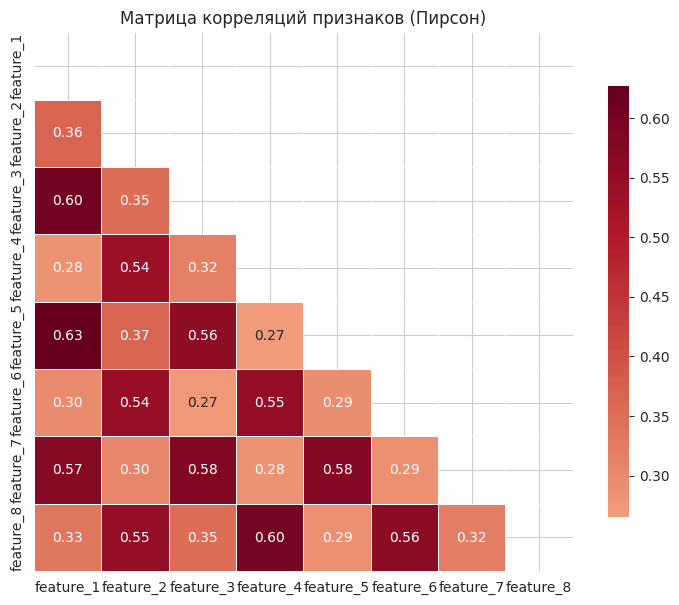

In [14]:
# Матрица корреляций: ищем паттерны связей между признаками
handler.plot_correlation_matrix('base')

In [15]:
# 3D PCA: Визуальная проверка разделимости классов в пространстве
# Должны быть видны три четких облака с центроидами
handler.plot_pca_advanced('base')

In [ ]:
# Pairplot: Детальный взгляд на парные распределения
handler.plot_pairplot('base')

In [ ]:
# Параметры генерации выбросов
A_list = [1, 10, 100]  # Количество добавляемых точек
B_list = [1, 10, 100]  # Удаленность выброса (координата)

# Генерация 9 дополнительных датасетов с разной степенью "загрязнения"
datasets_AB = handler.generate_injected_datasets(A_list, B_list)

# Визуализация влияния экстремального выброса
# Ожидаем увидеть сплющивание основного облака данных из-за масштабирования осей
key_example = "df_1_100" # 1 точка на расстоянии 100
print(f"Визуализация искажения пространства PCA для {key_example}:")
handler.plot_pca_advanced(key_example)

[Generate] Создано 9 модифицированных датасетов.
Визуализация искажения пространства PCA для df_1_100:


In [ ]:
# Объединяем все данные в один словарь для удобства
all_data = {'Original': df_base, **datasets_AB}

# Инициализация анализатора регрессий
analyzer = RegressionAnalyzer()

# Запуск анализа на одном признаке (feature_1)
# Сравниваем:
# 1. Original: Идеальная S-кривая и прямая линия.
# 2. df_10_10: Начало смещения линейной регрессии.
# 3. df_100_100: Полный провал линейной модели (горизонтальная линия) и возможный сдвиг логистической.
analyzer.analyze(
    all_data, 
    feature_col='feature_1', 
    classes=[0, 1], 
    dataset_names=['Original', 'df_10_10', 'df_100_1', 'df_1_100', 'df_10_100', 'df_100_100']
)

In [ ]:
# Выбираем первые 4 признака для построения модели
features_4 = ['feature_1', 'feature_2', 'feature_3', 'feature_4']

# 1. Обучение проектора (Fit)
# Находим веса (w1..w4) на ЧИСТОМ датасете (Original), чтобы зафиксировать "идеальную" модель
analyzer.fit_projection(all_data['Original'], features_4, classes=[0, 1])

# 2. Трансформация (Transform)
# Применяем найденные веса ко всем датасетам (включая грязные).
# Получаем новые датасеты, где вместо 8 признаков — один столбец 'projected_score'
projected_datasets = analyzer.project_datasets(all_data, features_4, classes=[0, 1])

# 3. Анализ проекций
# Строим те же графики регрессий, но теперь для сжатого признака.
# Ожидаем увидеть, как выбросы растягивают ось X и смещают распределения.
analyzer.analyze(
    projected_datasets, 
    is_projected=True, 
    dataset_names=['proj_Original', 'proj_df_10_100', 'proj_df_100_100']
)

Projection Model Fitted. Coefs: [-0.107 -0.102 -0.095 -0.124]


In [ ]:
# Инициализация визуализатора границ
visualizer = DecisionBoundaryVisualizer(feature_cols=[f'feature_{i+1}' for i in range(8)])

# Строим большие графики для пар признаков
# Сравниваем Original (ровные границы) с df_100_100 (искаженные границы)
# limit_pairs=4 ограничит вывод первыми 4-мя парами признаков, чтобы не перегружать браузер
visualizer.visualize_datasets(
    all_data, 
    dataset_names=['Original', 'df_100_1', 'df_100_100'], 
    classes=[0, 1], 
    limit_pairs=4
)

Processing 3 datasets for 4 pairs...
